# This script combines AWS Rekognition for object detection with the Meta Segment Anything Model (SAM) for precise instance segmentation. It identifies specific objects (cars, people), segments them, and saves the results to an S3 bucket.

In [1]:
# Install required packages

! pip install -q git+https://github.com/facebookresearch/segment-anything.git
! pip install -q opencv-python pycocotools matplotlib torch torchvision pillow


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autogluon-multimodal 1.4.0 requires nvidia-ml-py3<8.0,>=7.352.0, which is not installed.
sagemaker-studio 1.1.4 requires pydynamodb>=0.7.4, which is not installed.
amazon-sagemaker-jupyter-ai-q-developer 1.2.8 requires numpy<=2.0.1, but you have numpy 2.2.6 which is incompatible.
amazon-sagemaker-sql-magic 0.1.4 requires numpy<2, but you have numpy 2.2.6 which is incompatible.
autogluon-multimodal 1.4.0 requires transformers[sentencepiece]<4.50,>=4.38.0, but you have transformers 4.57.3 which is incompatible.
autogluon-timeseries 1.4.0 requires transformers[sentencepiece]<4.50,>=4.38.0, but you have transformers 4.57.3 which is incompatible.
gluonts 0.16.2 requires numpy<2.2,>=1.16, but you have numpy 2.2.6 which is incompatible.
langchain-aws 0.2.19 requires boto3>=1.37.24, but you have boto3 1.37.3 which is inco

In [2]:
# Start a Sagemaker session

import sagemaker
sess = sagemaker.Session()
role_arn = sess.get_caller_identity_arn()
print(f"✓ IAM Execution Role ARN: {role_arn}") 


sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/sagemaker-user/.config/sagemaker/config.yaml
✓ IAM Execution Role ARN: arn:aws:iam::606149139989:role/service-role/AmazonSageMaker-ExecutionRole-20260108T101280


In [3]:
# Test the access to the S3 bucket

import boto3
s3 = boto3.client('s3')
try:
    s3.head_object(Bucket='cv3-bucket', Key='Models/sam_vit_b_01ec64.pth')
    print("✅ SUCCESS! Permissions fixed!")
except Exception as e:
    print(f"❌ Access failed: {e}") 


✅ SUCCESS! Permissions fixed!


In [4]:
# Inspect the Sagemaker AI Studio user space

import json
import os

def get_sagemaker_metadata():
    metadata_file_path = '/opt/ml/metadata/resource-metadata.json'
    if os.path.exists(metadata_file_path):
        with open(metadata_file_path, 'r') as f:
            app_metadata = json.loads(f.read())
        return app_metadata
    else:
        return {"Error": "Metadata file not found. This code may not be running in a supported SageMaker environment."}

app_metadata = get_sagemaker_metadata()
print(json.dumps(app_metadata, indent=2))

if "UserProfileName" in app_metadata:
    print(f"\nSageMaker User Profile Name: {app_metadata['UserProfileName']}")
if "DomainId" in app_metadata:
    print(f"SageMaker Domain ID: {app_metadata['DomainId']}")
if "AppType" in app_metadata:
    print(f"SageMaker App Type: {app_metadata['AppType']}")
if "ResourceName" in app_metadata:
    print(f"SageMaker Resource Name: {app_metadata['ResourceName']}")


{
  "AppType": "JupyterLab",
  "DomainId": "d-bwfkac06p3dk",
  "SpaceName": "cv3",
  "UserProfileName": "default-20260108T101279",
  "ExecutionRoleArn": "arn:aws:iam::606149139989:role/service-role/AmazonSageMaker-ExecutionRole-20260108T101280",
  "ResourceArn": "arn:aws:sagemaker:us-east-2:606149139989:app/d-bwfkac06p3dk/cv3/JupyterLab/default",
  "ResourceName": "default",
  "AppImageVersion": "",
  "ResourceArnCaseSensitive": "arn:aws:sagemaker:us-east-2:606149139989:app/d-bwfkac06p3dk/cv3/JupyterLab/default",
  "IpAddressType": "ipv4"
}

SageMaker User Profile Name: default-20260108T101279
SageMaker Domain ID: d-bwfkac06p3dk
SageMaker App Type: JupyterLab
SageMaker Resource Name: default


# Perform memory cleanup

In [24]:
# Memory cleanup (Part 1)

# Delete the heavy variables if they exist from a previous run
# We use 'global' to make sure we are affecting the global namespace
for var_name in ['sam', 'mask_generator', 'masks', 'image_rgb']:
    if var_name in globals():
        print(var_name)
        del globals()[var_name]

# 2. Force Python's garbage collector to release the memory
import gc
gc.collect() 


sam
mask_generator


46622

In [25]:
# Memory cleanup (Part 2)

# Clear PyTorch's internal cache to make VRAM available again
import torch

result = torch.cuda.is_available()

if result:
    torch.cuda.empty_cache()
    # Print memory status to verify
    print(f"GPU Memory Free: {torch.cuda.mem_get_info()[0] / 1024**3:.2f} GB") 
else:
    print("CUDA is not available in this user space. There are no GPU's avaliable.")


GPU Memory Free: 14.41 GB


In [26]:
! nvidia-smi 

Thu Jan  8 16:21:44 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.105.08             Driver Version: 580.105.08     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       On  |   00000000:00:1E.0 Off |                    0 |
| N/A   30C    P0             31W /   70W |     155MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [8]:
# Cell 2: Import libraries

import boto3
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.patheffects as pe
import cv2
from PIL import Image
import io
import os
import tempfile
import json
from datetime import datetime
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

print("✓ Libraries imported successfully")


✓ Libraries imported successfully


In [30]:
# Cell 3: Configuration

S3_BUCKET = 'cv3-bucket'
S3_IMAGE_KEY = 'Images/ivona-roz-XoQZLm72MWA-unsplash-a.jpg' # 'huy-phan-Bux5nttxYpc-unsplash-a.jpg'
S3_MODEL_BUCKET = 'cv3-bucket'
S3_MODEL_KEY = 'Models/sam_vit_b_01ec64.pth' # 'sam_vit_h_4b8939.pth'
MODEL_TYPE = 'vit_b' # 'vit_h'
S3_BUCKET_REGION = 'us-east-2'
OUTPUT_PREFIX = 'segmentation_output'  # Where to save results in S3

# FILTER: Only process these labels
TARGET_LABELS = {'Car', 'Vehicle', 'Automobile', 'Transportation', 'Person', 'Pedestrian', 'Human'}

# Initialize AWS clients
s3_client = boto3.client('s3', region_name=S3_BUCKET_REGION)
rekognition_client = boto3.client('rekognition', region_name=S3_BUCKET_REGION)

print("✓ Configuration loaded")
print(f"Image: s3://{S3_BUCKET}/{S3_IMAGE_KEY}")
print(f"Model: s3://{S3_MODEL_BUCKET}/{S3_MODEL_KEY}")
print(f"Target labels: {TARGET_LABELS}") 


✓ Configuration loaded
Image: s3://cv3-bucket/Images/ivona-roz-XoQZLm72MWA-unsplash-a.jpg
Model: s3://cv3-bucket/Models/sam_vit_b_01ec64.pth
Target labels: {'Person', 'Automobile', 'Human', 'Car', 'Vehicle', 'Pedestrian', 'Transportation'}


In [10]:
# Cell 4: Helper functions

def load_model_from_s3(bucket, key):
    """Download SAM model from S3 to temporary location"""
    print(f"Loading SAM model from s3://{bucket}/Models/{key}")
    temp_file = tempfile.NamedTemporaryFile(delete=False, suffix='.pth')
    temp_path = temp_file.name
    temp_file.close()

    print("Downloading model...")
    s3_client.download_file(bucket, key, temp_path)
    print(f"✓ Model downloaded")
    return temp_path

def get_image_from_s3(bucket, key, max_size=512):
    """Load image from S3 and convert to RGB"""
    response = s3_client.get_object(Bucket=bucket, Key=key)
    img_data = response['Body'].read()
    img = Image.open(io.BytesIO(img_data))

    if img.mode != 'RGB':
        print(f"  Converting image from {img.mode} to RGB")
        img = img.convert('RGB')

    # Resize if too large (for faster CPU processing)
    if max_size and max(img.size) > max_size:
        ratio = max_size / max(img.size)
        new_size = (int(img.size[0] * ratio), int(img.size[1] * ratio))
        print(f"  Resizing from {img.size} to {new_size} for faster processing")
        img = img.resize(new_size, Image.Resampling.LANCZOS)

    return img

def get_image_size(bucket, key):
    """Get image dimensions from S3"""
    response = s3_client.get_object(Bucket=bucket, Key=key)
    image_data = response['Body'].read()
    image = Image.open(io.BytesIO(image_data))
    if image.mode != 'RGB':
        image = image.convert('RGB')
    return image.size

def euclidean_distance(box1, box2):
    """Calculate Euclidean distance between two bounding boxes"""
    return np.sqrt(sum((a - b) ** 2 for a, b in zip(box1, box2)))

print("✓ Helper functions loaded") 


✓ Helper functions loaded


In [11]:
# Cell 5: Rekognition detection with filtering

def get_rekognition_detections(bucket, key, target_labels, min_confidence=0.90):
    """Get object detections from AWS Rekognition - FILTERED by target labels"""
    print(f"Calling AWS Rekognition...")

    response = rekognition_client.detect_labels(
        Image={'S3Object': {'Bucket': bucket, 'Name': key}},
        MaxLabels=100,
        MinConfidence=min_confidence
    )

    width, height = get_image_size(bucket, key)
    print(f"Image dimensions: {width}x{height}")

    # Extract and filter detections
    detections = []
    for label in response['Labels']:
        if label['Name'] in target_labels:
            for instance in label.get('Instances', []):
                box = instance['BoundingBox']
                x = int(box['Left'] * width)
                y = int(box['Top'] * height)
                w = int(box['Width'] * width)
                h = int(box['Height'] * height)
                detections.append({
                    'label': label['Name'],
                    'confidence': instance['Confidence'],
                    'bbox': [x, y, w, h]
                })

    unique_detections = []
    seen_boxes = set()
    for det in detections:
        box_tuple = tuple(det['bbox'])
        if box_tuple not in seen_boxes:
            seen_boxes.add(box_tuple)
            unique_detections.append(det)

    print(f"✓ Found {len(unique_detections)} target objects (cars/pedestrians)")
    return unique_detections

print("✓ Rekognition function loaded") 


✓ Rekognition function loaded


In [28]:
# Cell 6: Initialize SAM model from S3

print("\n" + "=" * 50)
print("INITIALIZING SAM MODEL")
print("=" * 50)

sam_model_path = load_model_from_s3 (S3_MODEL_BUCKET, S3_MODEL_KEY)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

if device == "cpu":
    print("⚠ Running on CPU - using memory-efficient settings")
    torch.set_num_threads(1)

try:
    print(f"Loading SAM model ({MODEL_TYPE})...")
    sam = sam_model_registry[MODEL_TYPE](checkpoint=sam_model_path)
    sam.to(device=device)

    mask_generator = SamAutomaticMaskGenerator (
        sam,
        points_per_side=32,
        pred_iou_thresh=0.88,
        stability_score_thresh=0.95,
        crop_n_layers=1,
        crop_n_points_downscale_factor=2,
        min_mask_region_area=100,
    )

    print("✓ SAM model loaded successfully!")
    os.unlink(sam_model_path)
    print("✓ Temporary model file cleaned up")

except RuntimeError as e:
    print(f"❌ Error: {e}")
    os.unlink(sam_model_path)
    raise

print("=" * 50) 



INITIALIZING SAM MODEL
Loading SAM model from s3://cv3-bucket/Models/Models/sam_vit_b_01ec64.pth
✓ Model downloaded
Using device: cuda
Loading SAM model (vit_b)...
✓ SAM model loaded successfully!
✓ Temporary model file cleaned up


In [13]:
# Cell 7: Main processing function

def process_image(bucket, key, target_labels, resize_for_cpu=True, max_size=512):
    """Process image and return only cars and pedestrians with segmentation masks"""
    print("\n" + "="*50)
    print("PROCESSING IMAGE")
    print("="*50)

    print("Step 1: Loading image...")
    if resize_for_cpu and device == "cpu":
        image = get_image_from_s3(bucket, key, max_size=max_size)
    else:
        image = get_image_from_s3(bucket, key, max_size=None)

    image_np = np.array(image)
    print(f"✓ Image loaded: {image_np.shape}")

    print("\nStep 2: Getting Rekognition detections (cars/pedestrians only)...")
    rek_detections = get_rekognition_detections(bucket, key, target_labels)

    if len(rek_detections) == 0:
        print("⚠ No target objects (cars/pedestrians) detected")
        return image_np, [], []

    if resize_for_cpu and device == "cpu":
        original_img = Image.open(io.BytesIO(s3_client.get_object(Bucket=bucket, Key=key)['Body'].read()))
        if original_img.mode != 'RGB':
            original_img = original_img.convert('RGB')
        scale_x = image_np.shape[1] / original_img.size[0]
        scale_y = image_np.shape[0] / original_img.size[1]

        for det in rek_detections:
            x, y, w, h = det['bbox']
            det['bbox'] = [int(x*scale_x), int(y*scale_y), int(w*scale_x), int(h*scale_y)]

    print("\nStep 3: Generating SAM segmentation masks...")
    if device == "cpu":
        print(f"⚠ Running on CPU - will take 2-5 minutes")

    sam_masks = mask_generator.generate(image_np)
    print(f"✓ Generated {len(sam_masks)} SAM masks")

    print("\nStep 4: Matching target objects with SAM masks...")
    sam_bboxes = [(i, mask['bbox']) for i, mask in enumerate(sam_masks)]

    matched_results = []
    for rek_det in rek_detections:
        rek_bbox = rek_det['bbox']
        min_distance = float('inf')
        best_match = None

        for sam_idx, sam_bbox in sam_bboxes:
            distance = euclidean_distance(rek_bbox, sam_bbox)
            if distance < min_distance:
                min_distance = distance
                best_match = sam_idx

        if best_match is not None:
            matched_results.append({
                'label': rek_det['label'],
                'confidence': rek_det['confidence'],
                'rekognition_bbox': rek_bbox,
                'sam_bbox': sam_bboxes[best_match][1],
                'sam_mask_index': best_match,
                'segmentation_mask': sam_masks[best_match]['segmentation'],
                'area': sam_masks[best_match]['area']
            })

    print(f"✓ Matched {len(matched_results)} target objects")
    print("="*50)

    return image_np, sam_masks, matched_results

print("✓ Processing function loaded")


✓ Processing function loaded


In [31]:
# Cell 8: Run the processing

print("\n" + "#" * 50)
print("PROCESSING PIPELINE")
print("#" * 50)

image_np, all_sam_masks, matched_results = process_image (
    S3_BUCKET,
    S3_IMAGE_KEY,
    TARGET_LABELS,
    resize_for_cpu=True,
    max_size=512
)

print("\n" + "=" * 50)
print("DETECTION RESULTS (CARS & PEDESTRIANS ONLY)")
print("=" * 50)

if len(matched_results) == 0:
    print("No cars or pedestrians detected.")
else:
    for i, result in enumerate(matched_results, 1):
        print(f"\nObject {i}:")
        print(f"  Label:       {result['label']}")
        print(f"  Confidence:  {result['confidence']:.2f}%")
        print(f"  Mask Area:   {result['area']} pixels")

print("=" * 50)



##################################################
PROCESSING PIPELINE
##################################################

PROCESSING IMAGE
Step 1: Loading image...
✓ Image loaded: (1400, 2100, 3)

Step 2: Getting Rekognition detections (cars/pedestrians only)...
Calling AWS Rekognition...
Image dimensions: 2100x1400
✓ Found 6 target objects (cars/pedestrians)

Step 3: Generating SAM segmentation masks...
✓ Generated 59 SAM masks

Step 4: Matching target objects with SAM masks...
✓ Matched 6 target objects

DETECTION RESULTS (CARS & PEDESTRIANS ONLY)

Object 1:
  Label:       Car
  Confidence:  99.42%
  Mask Area:   382996 pixels

Object 2:
  Label:       Car
  Confidence:  99.32%
  Mask Area:   140694 pixels

Object 3:
  Label:       Person
  Confidence:  47.68%
  Mask Area:   1214 pixels

Object 4:
  Label:       Person
  Confidence:  3.81%
  Mask Area:   702 pixels

Object 5:
  Label:       Person
  Confidence:  3.26%
  Mask Area:   12199 pixels

Object 6:
  Label:       Person
  C


VISUALIZING STEP 2: REKOGNITION DETECTIONS


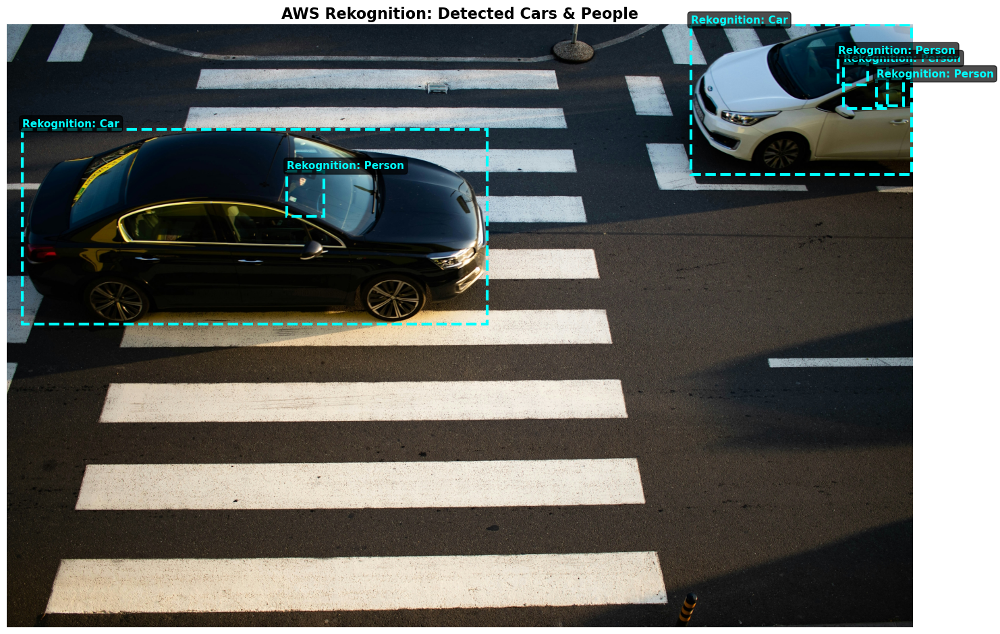

✓ Rekognition visualization complete.


In [32]:
# Cell 9: Visualize Raw Rekognition Detections

print("\n" + "=" * 50)
print("VISUALIZING STEP 2: REKOGNITION DETECTIONS")
print("=" * 50)

if len(matched_results) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    ax.imshow(image_np.copy())
    ax.set_autoscale_on(False)
    ax.set_title("AWS Rekognition: Detected Cars & People", fontsize=16, weight='bold')

    # Iterate through results to get labels and boxes
    for result in matched_results:
        x, y, w, h = result['rekognition_bbox']
        label_text = result['label']
        rect = patches.Rectangle((x, y), w, h, linewidth=3, edgecolor='cyan', facecolor='none', linestyle='--')
        ax.add_patch(rect)
        ax.text(x, y - 5, f"Rekognition: {label_text}", color='cyan',
                fontsize=11, weight='bold',
                bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

    ax.axis('off')
    plt.tight_layout()
    plt.show()
    print("✓ Rekognition visualization complete.")
else:
    print("No target objects were detected by Rekognition to visualize.")



VISUALIZING STEP 3: ALL SAM MASKS (UNFILTERED)
🤯 Visualizing all 59 masks generated by SAM...


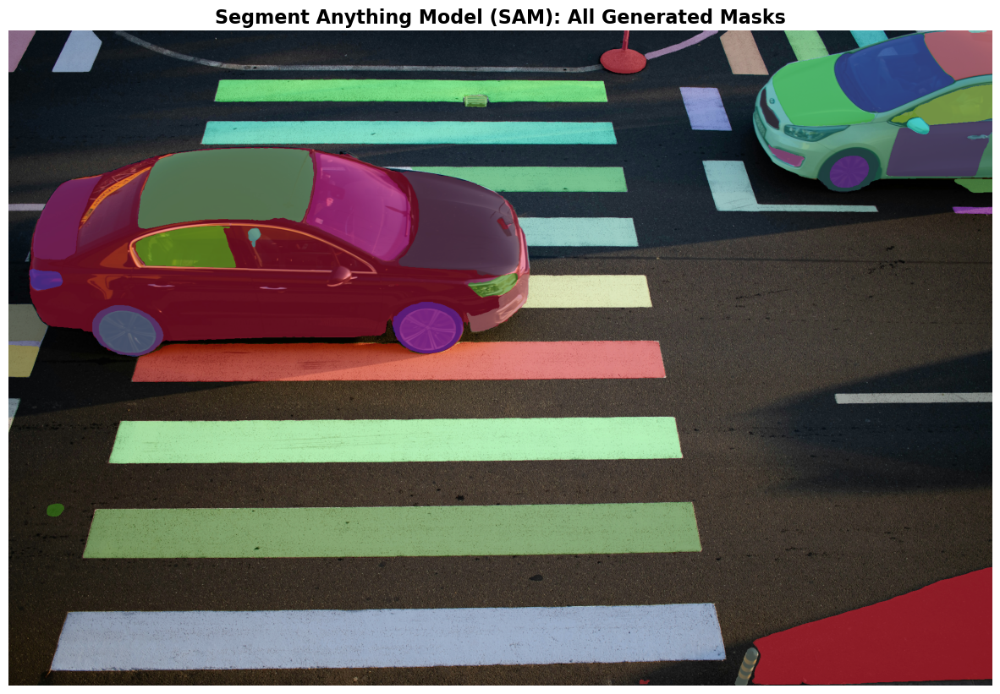

✓ SAM visualization complete.


In [33]:
# Cell 10: Visualize All SAM Masks - The "WOW" Effect

print("\n" + "=" * 50)
print("VISUALIZING STEP 3: ALL SAM MASKS (UNFILTERED)")
print("=" * 50)

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    for ann in sorted_anns:
        m = ann['segmentation']
        img = np.ones((m.shape[0], m.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.45)))

if len(all_sam_masks) > 0:
    print(f"🤯 Visualizing all {len(all_sam_masks)} masks generated by SAM...")
    plt.figure(figsize=(15, 15))
    plt.imshow(image_np.copy())
    show_anns(all_sam_masks)
    plt.title("Segment Anything Model (SAM): All Generated Masks", fontsize=16, weight='bold')
    plt.axis('off')
    plt.show()
    print("✓ SAM visualization complete.")
else:
    print("SAM did not generate any masks to visualize.")



VISUALIZING STEP 4: MATCH QUALITY (IoU)
✨ Plotting Intersection over Union (IoU) for each match...


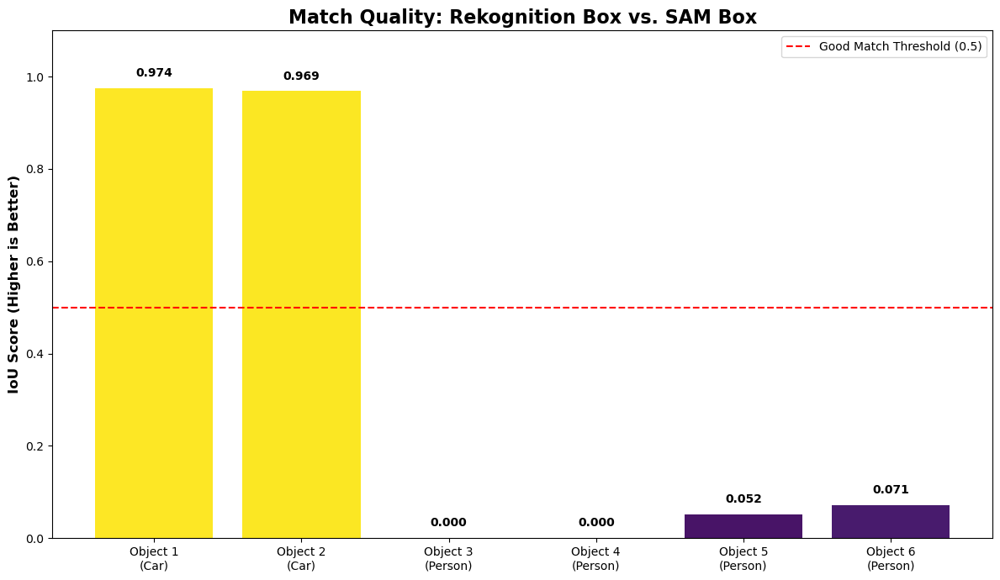

✓ IoU chart complete.


In [34]:
# Cell 11: Visualize Match Quality with Intersection over Union (IoU)

print("\n" + "=" * 50)
print("VISUALIZING STEP 4: MATCH QUALITY (IoU)")
print("=" * 50)

def calculate_iou(boxA, boxB):
    """
    Calculate Intersection over Union (IoU) for two bounding boxes.
    Boxes are in [x, y, w, h] format.
    """
    xA = boxA[0]
    yA = boxA[1]
    xB = boxA[0] + boxA[2]
    yB = boxA[1] + boxA[3]
    x2A = boxB[0]
    y2A = boxB[1]
    x2B = boxB[0] + boxB[2]
    y2B = boxB[1] + boxB[3]
    x_inter1 = max(xA, x2A)
    y_inter1 = max(yA, y2A)
    x_inter2 = min(xB, x2B)
    y_inter2 = min(yB, y2B)
    inter_width = max(0, x_inter2 - x_inter1)
    inter_height = max(0, y_inter2 - y_inter1)
    inter_area = inter_width * inter_height
    boxA_area = boxA[2] * boxA[3]
    boxB_area = boxB[2] * boxB[3]
    union_area = float(boxA_area + boxB_area - inter_area)
    iou = inter_area / union_area if union_area > 0 else 0
    return iou

if len(matched_results) > 0:
    print("✨ Plotting Intersection over Union (IoU) for each match...")
    iou_scores = []
    labels = []
    for i, result in enumerate(matched_results):
        iou = calculate_iou(result['rekognition_bbox'], result['sam_bbox'])
        iou_scores.append(iou)
        labels.append(f"Object {i+1}\n({result['label']})")

    fig, ax = plt.subplots(figsize=(12, 7))
    colors = plt.cm.viridis(np.array(iou_scores) / max(iou_scores))
    bars = ax.bar(labels, iou_scores, color=colors)

    ax.set_ylabel('IoU Score (Higher is Better)', fontsize=12, weight='bold')
    ax.set_title('Match Quality: Rekognition Box vs. SAM Box', fontsize=16, weight='bold')
    ax.set_ylim(0, 1.1)
    ax.axhline(y=0.5, color='r', linestyle='--', label='Good Match Threshold (0.5)')
    ax.legend()

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.02, f'{yval:.3f}', ha='center', va='bottom', weight='bold')

    plt.tight_layout()
    plt.show()
    print("✓ IoU chart complete.")
else:
    print("No matches to calculate IoU for.")



##################################################
FINAL VISUALIZATION: SEGMENTED OBJECTS WITH BOUNDING BOXES
##################################################


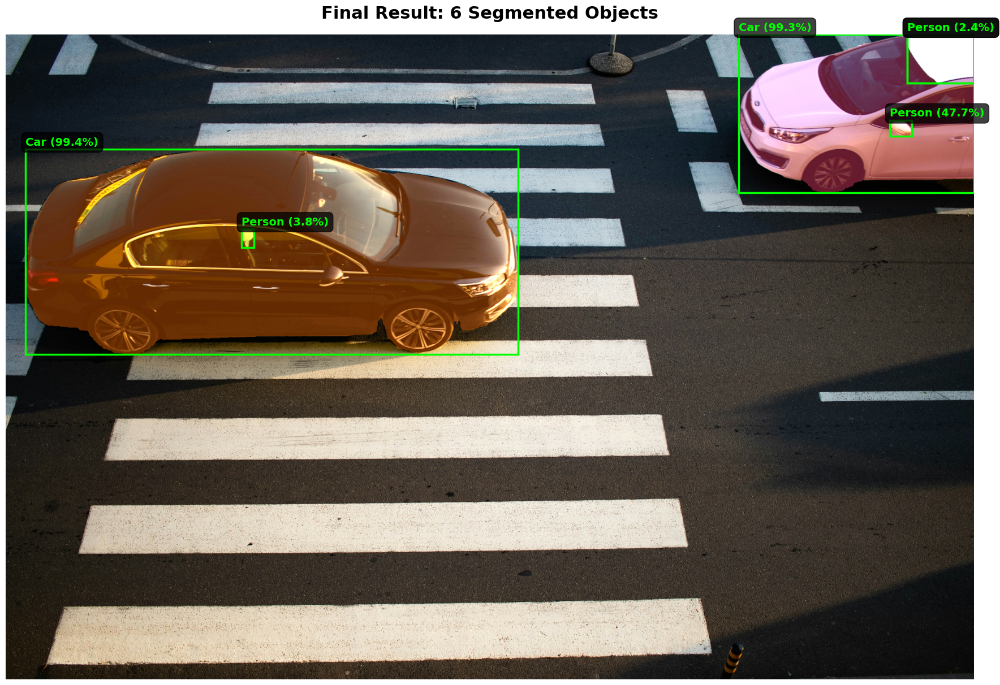

✓ Final visualization with boxes complete.


In [35]:
# Cell 12: Final Result Visualization (With Boxes)

print("\n" + "#" * 50)
print("FINAL VISUALIZATION: SEGMENTED OBJECTS WITH BOUNDING BOXES")
print("#" * 50)

if len(matched_results) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(18, 18))

    # Use a copy of the original image to draw on
    final_image_with_boxes = image_np.copy()
    ax.set_title(f"Final Result: {len(matched_results)} Segmented Objects", fontsize=22, weight='bold', pad=20)

    for result in matched_results:
        mask = result['segmentation_mask']
        color = np.random.rand(3)
        colored_mask = np.zeros_like(final_image_with_boxes)
        colored_mask[mask] = (color * 255).astype(np.uint8)

        # Blend the mask with the image copy
        overlay = cv2.addWeighted(final_image_with_boxes, 1, colored_mask, 0.5, 0)
        final_image_with_boxes[mask] = overlay[mask]

    ax.imshow(final_image_with_boxes)

    for result in matched_results:
        x, y, w, h = result['sam_bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=2.5, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        label_text = f"{result['label']} ({result['confidence']:.1f}%)"
        ax.text(x, y - 8, label_text, color='lime', fontsize=14, weight='bold',
                bbox=dict(boxstyle='round', facecolor='black', alpha=0.75, pad=0.4))

    ax.axis('off')
    plt.tight_layout()
    plt.show()
    print("✓ Final visualization with boxes complete.")
else:
    print("No cars or pedestrians to visualize.")



##################################################
BONUS VISUALIZATION: MASKS ONLY (NO BOUNDING BOXES)
##################################################


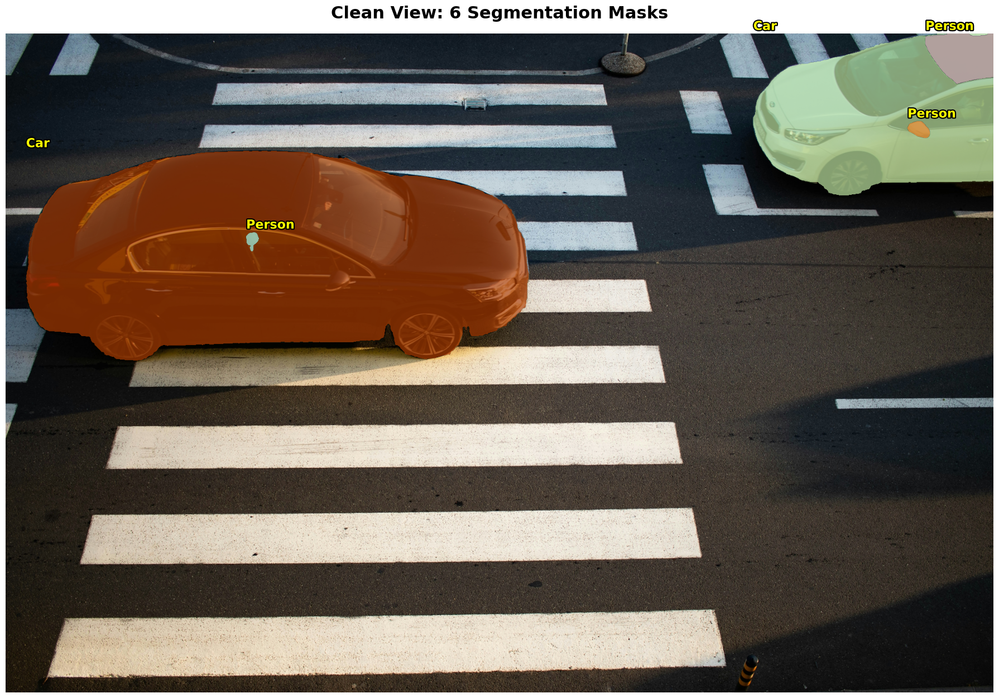

✓ Masks-only visualization complete.


In [36]:
# Cell 13: Final Visualization (Masks Only)

print("\n" + "#" * 50)
print("BONUS VISUALIZATION: MASKS ONLY (NO BOUNDING BOXES)")
print("#" * 50)

if len(matched_results) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(18, 18))
    ax.imshow(image_np.copy()) # Start with a clean copy of the original image
    ax.set_title(f"Clean View: {len(matched_results)} Segmentation Masks", fontsize=22, weight='bold', pad=20)

    for result in matched_results:
        mask = result['segmentation_mask']

        # Create a random color for the mask overlay
        color_mask = np.random.random((1, 3)).tolist()[0]

        # Create an RGBA image for the mask with transparency
        img_overlay = np.zeros((mask.shape[0], mask.shape[1], 4), dtype=np.float32)
        img_overlay[mask, :3] = color_mask
        img_overlay[mask, 3] = 0.7  # Set alpha/transparency to 70%
        ax.imshow(img_overlay)

        # Add label text without a bounding box
        x, y, w, h = result['sam_bbox']
        label_text = f"{result['label']}"
        ax.text(x, y - 8, label_text, color='yellow', fontsize=16, weight='bold',
                # Add a subtle shadow for readability using the imported 'pe' module
                path_effects=[pe.withStroke(linewidth=3, foreground='black')])

    ax.axis('off')
    plt.tight_layout()
    plt.show()
    print("✓ Masks-only visualization complete.")
else:
    print("No masks to visualize.")



##################################################
FINAL DATA VIEW: WHITE MASKS ON BLACK BACKGROUND
##################################################


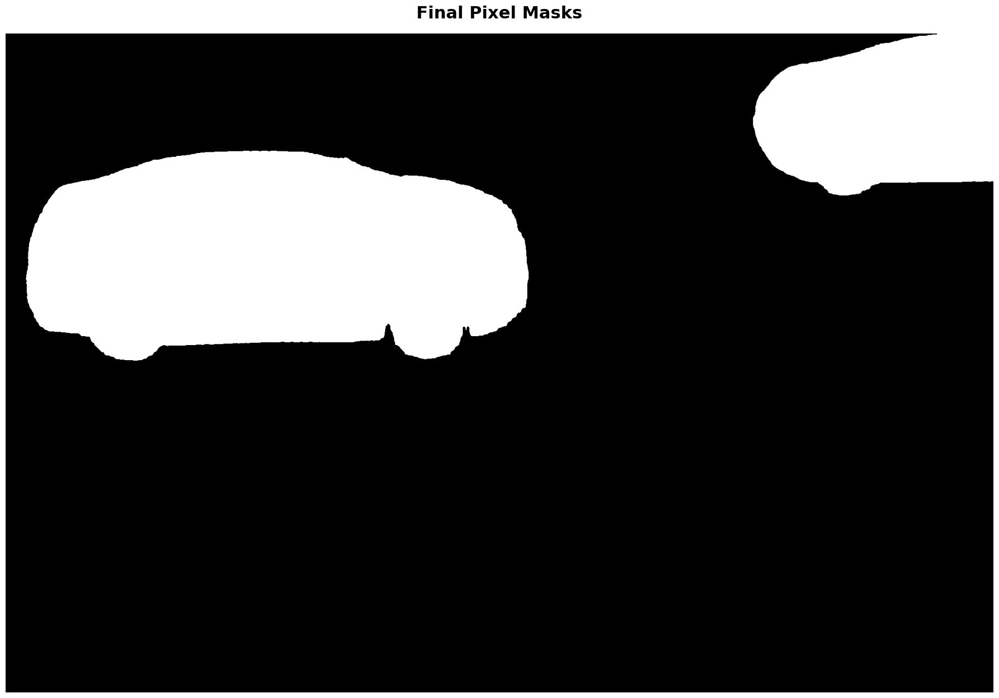

✓ Black and white mask visualization complete.


In [37]:
# Cell 14: Final Visualization (Black & White Masks - NEW)

print("\n" + "#" * 50)
print("FINAL DATA VIEW: WHITE MASKS ON BLACK BACKGROUND")
print("#" * 50)

if len(matched_results) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(18, 18))
    
    # Create a black canvas with the same dimensions as the original image
    black_canvas = np.zeros_like(image_np, dtype=np.uint8)
    
    # Iterate through the matched results and "paint" the masks white
    for result in matched_results:
        mask = result['segmentation_mask']
        black_canvas[mask] = [255, 255, 255] # Set pixels to white

    ax.imshow(black_canvas)
    ax.set_title("Final Pixel Masks", fontsize=22, weight='bold', pad=20)
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    print("✓ Black and white mask visualization complete.")
else:
    print("No masks to create a black and white image.")


In [38]:
# Cell 15: Save results to S3 (helper function)

def save_filtered_results_to_s3 (image_np, matched_results, image_key, output_bucket, output_prefix):
    """Save segmentation results for cars and pedestrians only"""

    if len(matched_results) == 0:
        print("No results to save")
        return

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    image_name = os.path.splitext(os.path.basename(image_key))[0]

    print(f"\n💾 Saving results to s3://{output_bucket}/{output_prefix}/")

    metadata = {
        'timestamp': timestamp,
        'source_image': image_key,
        'num_detections': len(matched_results),
        'target_labels': list(TARGET_LABELS),
        'detections': []
    }

    for i, result in enumerate(matched_results):
        metadata['detections'].append({
            'object_id': i,
            'label': result['label'],
            'confidence': float(result['confidence']),
            'sam_bbox': [int(x) for x in result['sam_bbox']],
            'mask_area': int(result['area'])
        })

    metadata_key = f"{output_prefix}/{image_name}_metadata_{timestamp}.json"
    s3_client.put_object(
        Bucket=output_bucket,
        Key=metadata_key,
        Body=json.dumps(metadata, indent=2),
        ContentType='application/json'
    )
    print(f"✓ Metadata: s3://{output_bucket}/{metadata_key}")

    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    ax.imshow(image_np)
    ax.set_autoscale_on(False)

    for result in matched_results:
        mask = result['segmentation_mask']
        img = np.ones((mask.shape[0], mask.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, mask*0.5)))
        x, y, w, h = result['sam_bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=2,
                                 edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        label_text = f"{result['label']}\n{result['confidence']:.1f}%"
        ax.text(x, y-5, label_text, color='lime', fontsize=11, weight='bold',
                bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))

    ax.set_title(f'Segmented: {len(matched_results)} objects', fontsize=16, weight='bold')
    ax.axis('off')

    buffer = io.BytesIO()
    plt.savefig(buffer, format='png', bbox_inches='tight', dpi=150)
    buffer.seek(0)
    plt.close()

    annotated_key = f"{output_prefix}/{image_name}_segmented_{timestamp}.png"
    s3_client.put_object(
        Bucket=output_bucket,
        Key=annotated_key,
        Body=buffer.getvalue(),
        ContentType='image/png'
    )
    print(f"✓ Annotated image: s3://{output_bucket}/{annotated_key}")

    for i, result in enumerate(matched_results):
        mask = result['segmentation_mask']
        mask_img = Image.fromarray((mask * 255).astype(np.uint8))
        buffer = io.BytesIO()
        mask_img.save(buffer, format='PNG')
        buffer.seek(0)
        label_clean = result['label'].replace(' ', '_').lower()
        mask_key = f"{output_prefix}/masks/{image_name}_mask_{i:02d}_{label_clean}_{timestamp}.png"
        s3_client.put_object(
            Bucket=output_bucket,
            Key=mask_key,
            Body=buffer.getvalue(),
            ContentType='image/png'
        )
        print(f"✓ Mask {i+1}: s3://{output_bucket}/{mask_key}")

    print(f"\n✅ All results saved successfully!")
    print(f"📁 Location: s3://{output_bucket}/{output_prefix}/")
    return metadata_key, annotated_key

print("✓ Save Results function loaded")


✓ Save Results function loaded


In [39]:
# Cell 16: Save results to S3

if len(matched_results) > 0:
    print("\n" + "=" * 50)
    print("SAVING RESULTS TO S3")
    print("=" * 50)

    metadata_key, annotated_key = save_filtered_results_to_s3 (
        image_np,
        matched_results,
        S3_IMAGE_KEY,
        S3_BUCKET,
        OUTPUT_PREFIX
    )
else:
    print("\nNo results to save")



SAVING RESULTS TO S3

💾 Saving results to s3://cv3-bucket/segmentation_output/
✓ Metadata: s3://cv3-bucket/segmentation_output/ivona-roz-XoQZLm72MWA-unsplash-a_metadata_20260108_162818.json
✓ Annotated image: s3://cv3-bucket/segmentation_output/ivona-roz-XoQZLm72MWA-unsplash-a_segmented_20260108_162818.png
✓ Mask 1: s3://cv3-bucket/segmentation_output/masks/ivona-roz-XoQZLm72MWA-unsplash-a_mask_00_car_20260108_162818.png
✓ Mask 2: s3://cv3-bucket/segmentation_output/masks/ivona-roz-XoQZLm72MWA-unsplash-a_mask_01_car_20260108_162818.png
✓ Mask 3: s3://cv3-bucket/segmentation_output/masks/ivona-roz-XoQZLm72MWA-unsplash-a_mask_02_person_20260108_162818.png
✓ Mask 4: s3://cv3-bucket/segmentation_output/masks/ivona-roz-XoQZLm72MWA-unsplash-a_mask_03_person_20260108_162818.png
✓ Mask 5: s3://cv3-bucket/segmentation_output/masks/ivona-roz-XoQZLm72MWA-unsplash-a_mask_04_person_20260108_162818.png
✓ Mask 6: s3://cv3-bucket/segmentation_output/masks/ivona-roz-XoQZLm72MWA-unsplash-a_mask_05_pers

In [40]:
# Cell 17: Pipeline complete

print("\n" + "#" * 50)
print("PIPELINE COMPLETE!")
print("#" * 50) 



##################################################
PIPELINE COMPLETE!
##################################################


In [1]:
! nvidia-smi

Fri Dec 26 09:04:58 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.105.08             Driver Version: 580.105.08     CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       On  |   00000000:00:1E.0 Off |                    0 |
| N/A   34C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# Enter the process id from the above cell.

! kill -9 2036

In [ ]:
! nvidia-smi 